In [1]:
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
df=pd.read_csv('train.csv')
df.head()

,index,beer/ABV,beer/beerId,beer/brewerId,beer/name,beer/style,review/appearance,review/aroma,review/overall,review/palate,review/taste,review/text,review/timeStruct,review/timeUnix,user/ageInSeconds,user/birthdayRaw,user/birthdayUnix,user/gender,user/profileName
0,40163,5.0,46634,14338,Chiostro,Herbed / Spiced Beer,4.0,4.0,4.0,4.0,4.0,Pours a clouded gold with a thin white head. N...,"{'min': 38, 'hour': 3, 'mday': 16, 'sec': 10, ...",1229398690,NaN,NaN,NaN,NaN,RblWthACoz
1,8135,11.0,3003,395,Bearded Pat's Barleywine,American Barleywine,4.0,3.5,3.5,3.5,3.0,12oz bottle into 8oz snifter.\t\tDeep ruby red...,"{'min': 38, 'hour': 23, 'mday': 8, 'sec': 58, ...",1218238738,NaN,NaN,NaN,NaN,BeerSox
2,10529,4.7,961,365,Naughty Nellie's Ale,American Pale Ale (APA),3.5,4.0,3.5,3.5,3.5,First enjoyed at the brewpub about 2 years ago...,"{'min': 7, 'hour': 18, 'mday': 26, 'sec': 2, '...",1101492422,NaN,NaN,NaN,Male,mschofield
3,44610,4.4,429,1,Pilsner Urquell,Czech Pilsener,3.0,3.0,2.5,3.0,3.0,First thing I noticed after pouring from green...,"{'min': 7, 'hour': 1, 'mday': 20, 'sec': 5, 'y...",1308532025,1.209827e+09,"Aug 10, 1976",208508400.0,Male,molegar76
4,37062,4.4,4904,1417,Black Sheep Ale (Special),English Pale Ale,4.0,3.0,3.0,3.5,2.5,A: pours an amber with a one finger head but o...,"{'min': 51, 'hour': 6, 'mday': 12, 'sec': 48, ...",1299912708,NaN,NaN,NaN,NaN,Brewbro000


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37500 entries, 0 to 37499
Data columns (total 19 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   index              37500 non-null  int64  
 1   beer/ABV           37500 non-null  float64
 2   beer/beerId        37500 non-null  int64  
 3   beer/brewerId      37500 non-null  int64  
 4   beer/name          37500 non-null  object 
 5   beer/style         37500 non-null  object 
 6   review/appearance  37500 non-null  float64
 7   review/aroma       37500 non-null  float64
 8   review/overall     37500 non-null  float64
 9   review/palate      37500 non-null  float64
 10  review/taste       37500 non-null  float64
 11  review/text        37490 non-null  object 
 12  review/timeStruct  37500 non-null  object 
 13  review/timeUnix    37500 non-null  int64  
 14  user/ageInSeconds  7856 non-null   float64
 15  user/birthdayRaw   7856 non-null   object 
 16  user/birthdayUnix  785

In [4]:
df['beer/beerId'].value_counts()

11757    1883
19960    1441
5441     1064
16074    1051
7463      983
         ... 
75848       1
26853       1
42273       1
41116       1
67406       1
Name: beer/beerId, Length: 1731, dtype: int64

In [5]:
df['beer/brewerId'].value_counts()

1199     14976
394       2937
14879     2351
263       1809
3268      1277
         ...  
27133        1
15607        1
3207         1
3408         1
17783        1
Name: beer/brewerId, Length: 212, dtype: int64

## Removing all unnecessary columns ,  
#### index,beer/name,beer/style

In [6]:
df.drop(['index','beer/name','beer/style'],axis='columns', inplace=True)
df.head(5)

,beer/ABV,beer/beerId,beer/brewerId,review/appearance,review/aroma,review/overall,review/palate,review/taste,review/text,review/timeStruct,review/timeUnix,user/ageInSeconds,user/birthdayRaw,user/birthdayUnix,user/gender,user/profileName
0,5.0,46634,14338,4.0,4.0,4.0,4.0,4.0,Pours a clouded gold with a thin white head. N...,"{'min': 38, 'hour': 3, 'mday': 16, 'sec': 10, ...",1229398690,NaN,NaN,NaN,NaN,RblWthACoz
1,11.0,3003,395,4.0,3.5,3.5,3.5,3.0,12oz bottle into 8oz snifter.\t\tDeep ruby red...,"{'min': 38, 'hour': 23, 'mday': 8, 'sec': 58, ...",1218238738,NaN,NaN,NaN,NaN,BeerSox
2,4.7,961,365,3.5,4.0,3.5,3.5,3.5,First enjoyed at the brewpub about 2 years ago...,"{'min': 7, 'hour': 18, 'mday': 26, 'sec': 2, '...",1101492422,NaN,NaN,NaN,Male,mschofield
3,4.4,429,1,3.0,3.0,2.5,3.0,3.0,First thing I noticed after pouring from green...,"{'min': 7, 'hour': 1, 'mday': 20, 'sec': 5, 'y...",1308532025,1.209827e+09,"Aug 10, 1976",208508400.0,Male,molegar76
4,4.4,4904,1417,4.0,3.0,3.0,3.5,2.5,A: pours an amber with a one finger head but o...,"{'min': 51, 'hour': 6, 'mday': 12, 'sec': 48, ...",1299912708,NaN,NaN,NaN,NaN,Brewbro000


In [7]:
df['user/ageInSeconds'].isnull().value_counts()

True     29644
False     7856
Name: user/ageInSeconds, dtype: int64

In [8]:
df['user/birthdayRaw'].isnull().value_counts()

True     29644
False     7856
Name: user/birthdayRaw, dtype: int64

In [9]:
df['user/birthdayUnix'].isnull().value_counts()

True     29644
False     7856
Name: user/birthdayUnix, dtype: int64

In [10]:
df['user/profileName'].isnull().value_counts()

False    37495
True         5
Name: user/profileName, dtype: int64

In [11]:
df['user/gender'].isnull().value_counts()

True     22186
False    15314
Name: user/gender, dtype: int64

In [12]:
df['user/gender'].value_counts() #Gender Might have correlation with output, so lets check it.

Male      15069
Female      245
Name: user/gender, dtype: int64

## Dropping unnecessary columns
#### user/ageInSeconds,	user/birthdayRaw,	user/birthdayUnix,user/profileName

In [13]:
df.drop(['user/ageInSeconds', 'user/birthdayRaw', 'user/birthdayUnix','user/profileName'],axis='columns',inplace=True)
df.head()

,beer/ABV,beer/beerId,beer/brewerId,review/appearance,review/aroma,review/overall,review/palate,review/taste,review/text,review/timeStruct,review/timeUnix,user/gender
0,5.0,46634,14338,4.0,4.0,4.0,4.0,4.0,Pours a clouded gold with a thin white head. N...,"{'min': 38, 'hour': 3, 'mday': 16, 'sec': 10, ...",1229398690,NaN
1,11.0,3003,395,4.0,3.5,3.5,3.5,3.0,12oz bottle into 8oz snifter.\t\tDeep ruby red...,"{'min': 38, 'hour': 23, 'mday': 8, 'sec': 58, ...",1218238738,NaN
2,4.7,961,365,3.5,4.0,3.5,3.5,3.5,First enjoyed at the brewpub about 2 years ago...,"{'min': 7, 'hour': 18, 'mday': 26, 'sec': 2, '...",1101492422,Male
3,4.4,429,1,3.0,3.0,2.5,3.0,3.0,First thing I noticed after pouring from green...,"{'min': 7, 'hour': 1, 'mday': 20, 'sec': 5, 'y...",1308532025,Male
4,4.4,4904,1417,4.0,3.0,3.0,3.5,2.5,A: pours an amber with a one finger head but o...,"{'min': 51, 'hour': 6, 'mday': 12, 'sec': 48, ...",1299912708,NaN


# Lets create a copy of df to check correlation of gender  and time stamp

In [14]:
df_copy=df[['review/overall','user/gender','review/timeUnix']]
df_copy.head()

,review/overall,user/gender,review/timeUnix
0,4.0,NaN,1229398690
1,3.5,NaN,1218238738
2,3.5,Male,1101492422
3,2.5,Male,1308532025
4,3.0,NaN,1299912708


In [15]:
df_copy=df_copy.dropna()
df_copy.head()

,review/overall,user/gender,review/timeUnix
2,3.5,Male,1101492422
3,2.5,Male,1308532025
8,4.5,Male,1279250773
13,2.0,Male,1142907966
19,4.0,Male,1081644000


In [16]:
df_copy['user/gender'].replace({'Male':1,'Female':0},inplace=True)
df_copy.head()

,review/overall,user/gender,review/timeUnix
2,3.5,1,1101492422
3,2.5,1,1308532025
8,4.5,1,1279250773
13,2.0,1,1142907966
19,4.0,1,1081644000


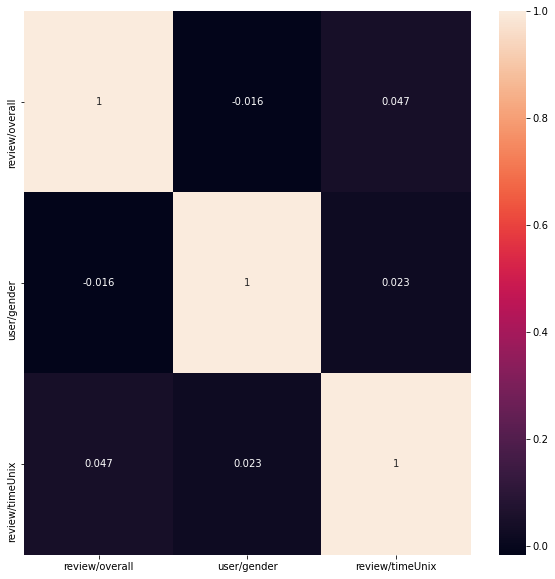

In [17]:
plt.figure(figsize=(10,10))
corr=df_copy.corr()
sns.heatmap(corr,annot=True)

#### Gender has almost no correlation with the overall review, so we can safely drop it. while we are keeping time stamp

In [18]:
df.drop(['user/gender'],axis='columns',inplace=True)
df.head()

,beer/ABV,beer/beerId,beer/brewerId,review/appearance,review/aroma,review/overall,review/palate,review/taste,review/text,review/timeStruct,review/timeUnix
0,5.0,46634,14338,4.0,4.0,4.0,4.0,4.0,Pours a clouded gold with a thin white head. N...,"{'min': 38, 'hour': 3, 'mday': 16, 'sec': 10, ...",1229398690
1,11.0,3003,395,4.0,3.5,3.5,3.5,3.0,12oz bottle into 8oz snifter.\t\tDeep ruby red...,"{'min': 38, 'hour': 23, 'mday': 8, 'sec': 58, ...",1218238738
2,4.7,961,365,3.5,4.0,3.5,3.5,3.5,First enjoyed at the brewpub about 2 years ago...,"{'min': 7, 'hour': 18, 'mday': 26, 'sec': 2, '...",1101492422
3,4.4,429,1,3.0,3.0,2.5,3.0,3.0,First thing I noticed after pouring from green...,"{'min': 7, 'hour': 1, 'mday': 20, 'sec': 5, 'y...",1308532025
4,4.4,4904,1417,4.0,3.0,3.0,3.5,2.5,A: pours an amber with a one finger head but o...,"{'min': 51, 'hour': 6, 'mday': 12, 'sec': 48, ...",1299912708


### Removing 'review/timeStruct'  as we are keeping time stamp or time/unix

In [19]:
df.drop(['review/timeStruct'],axis='columns',inplace=True)
df.head()

,beer/ABV,beer/beerId,beer/brewerId,review/appearance,review/aroma,review/overall,review/palate,review/taste,review/text,review/timeUnix
0,5.0,46634,14338,4.0,4.0,4.0,4.0,4.0,Pours a clouded gold with a thin white head. N...,1229398690
1,11.0,3003,395,4.0,3.5,3.5,3.5,3.0,12oz bottle into 8oz snifter.\t\tDeep ruby red...,1218238738
2,4.7,961,365,3.5,4.0,3.5,3.5,3.5,First enjoyed at the brewpub about 2 years ago...,1101492422
3,4.4,429,1,3.0,3.0,2.5,3.0,3.0,First thing I noticed after pouring from green...,1308532025
4,4.4,4904,1417,4.0,3.0,3.0,3.5,2.5,A: pours an amber with a one finger head but o...,1299912708


### Scaling the respective columns so that value comes in range[0,1] 

In [20]:
columns=['beer/ABV','beer/beerId','beer/brewerId','review/appearance','review/aroma','review/palate','review/taste','review/timeUnix']

In [21]:
from sklearn.preprocessing import MinMaxScaler
min_max_scaler=MinMaxScaler()
df[columns]=min_max_scaler.fit_transform(df[columns])

In [22]:
df.head()

,beer/ABV,beer/beerId,beer/brewerId,review/appearance,review/aroma,review/overall,review/palate,review/taste,review/text,review/timeUnix
0,0.085069,0.603113,0.515794,0.8,0.750,4.0,0.750,0.750,Pours a clouded gold with a thin white head. N...,0.757813
1,0.189236,0.036712,0.014175,0.8,0.625,3.5,0.625,0.500,12oz bottle into 8oz snifter.\t\tDeep ruby red...,0.729912
2,0.079861,0.010204,0.013095,0.7,0.750,3.5,0.625,0.625,First enjoyed at the brewpub about 2 years ago...,0.438025
3,0.074653,0.003297,0.000000,0.6,0.500,2.5,0.500,0.500,First thing I noticed after pouring from green...,0.955660
4,0.074653,0.061390,0.050943,0.8,0.500,3.0,0.625,0.375,A: pours an amber with a one finger head but o...,0.934111


### Transforming Labeled review

In [23]:
df['review/overall'].value_counts()

4.0    13868
4.5     8666
3.5     6551
3.0     3319
5.0     2671
2.5     1193
2.0      807
1.5      248
1.0      176
0.0        1
Name: review/overall, dtype: int64

In [24]:
classes={0: 1, 0.5:2 ,1:3, 1.5:4, 2.0 :5, 2.5: 6, 3 :7,3.5: 8, 4: 9 ,4.5: 10,5:11}

In [25]:
df['review/overall'].replace(classes,inplace=True)

In [26]:
df['review/overall']

0        9.0
1        8.0
2        8.0
3        6.0
4        7.0
        ... 
37495    8.0
37496    8.0
37497    9.0
37498    9.0
37499    9.0
Name: review/overall, Length: 37500, dtype: float64

### So now we have processed all the columns except review 'text'. let's proceed now to that

In [27]:
from nltk.corpus import stopwords
stopset=set(stopwords.words('english'))

In [28]:
import string
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [29]:
df['review/text'][0]

'Pours a clouded gold with a thin white head. Nose is quite floral with a larger amount of spices added. Definitely a spice forward fragrance. Flavor has an odd burn that hits on the first sip. After it fades it seems like a dirty vanilla aftertaste. Perhaps this is the absinthe? Regardless of that, I get a quite spiced tone on the tongue. Almost feel a little heat from it. I think that my inexperienced palate on these spices is contributing to my ignorance of what precisely they are. Overall a nice drinker indeed.'

In [30]:
df['review/text'].isnull().any() #true means there are null values

True

In [31]:
df.isnull().value_counts()

beer/ABV  beer/beerId  beer/brewerId  review/appearance  review/aroma  review/overall  review/palate  review/taste  review/text  review/timeUnix
False     False        False          False              False         False           False          False         False        False              37490
                                                                                                                    True         False                 10
dtype: int64

In [32]:
df.shape

(37500, 10)

In [33]:
df[df['review/text'].isnull()].index.tolist()

[3171, 4131, 6111, 10981, 14562, 21832, 23868, 26837, 33782, 35305]

In [34]:
df=df.dropna()

In [35]:
df['review/text'].isnull().value_counts()#true means there are null values

False    37490
Name: review/text, dtype: int64

In [36]:
df.shape

(37490, 10)

In [37]:
df.reset_index(inplace=True)

-> Removing Stop Words and punctuations and stemming them

In [38]:
from nltk.stem.porter import PorterStemmer
porter = PorterStemmer()

In [39]:
def review_cleaning(review):
    
    review=''.join([char for char in review if not char.isdigit()])#removing numbers
    
    review_stop_cleaned=[word.lower() for word in review.split() if word.lower() not in stopset]
    review_stop_cleaned=' '.join(review_stop_cleaned)
    
    review_stop_punc_cleaned=[char for char in review_stop_cleaned if char not in string.punctuation]
    review_stop_punc_cleaned=''.join(review_stop_punc_cleaned)
    
    review_stop_punc_cleaned=[word for word in review_stop_punc_cleaned.split()]
    
    stemmed = [porter.stem(word) for word in review_stop_punc_cleaned]
    
    return stemmed

In [40]:
review_clean=df['review/text'].apply(review_cleaning)

In [41]:
review_clean_sentences=[' '.join(sentence) for sentence in review_clean]
review_clean_sentences

['pour cloud gold thin white head nose quit floral larger amount spice ad definit spice forward fragranc flavor odd burn hit first sip fade seem like dirti vanilla aftertast perhap absinth regardless that get quit spice tone tongu almost feel littl heat it think inexperienc palat spice contribut ignor precis are overal nice drinker inde',
 'oz bottl oz snifter deep rubi red hue one finger light tan head settl thin rim along glass sharp pierc hop light hard candi background hop provid bitter sharp would expect mostli light candi flavor like aroma full bodi good carbon finish linger sweet flavor bit bitter sweet barleywin weird hard candi flavor seem domin bad would like littl complex',
 'first enjoy brewpub year ago final manag get bottl slightli hazi orangeamb top two finger foami white head nice fruiti aroma soft floral tea toast fruiti slightli grapefru hop note toast biscuiti malt balanc hoppier floral warm up lightmedium bodi like better draft still solid beer',
 'first thing notic

In [42]:
sentence=' '.join(review_clean_sentences)
sentence

'pour cloud gold thin white head nose quit floral larger amount spice ad definit spice forward fragranc flavor odd burn hit first sip fade seem like dirti vanilla aftertast perhap absinth regardless that get quit spice tone tongu almost feel littl heat it think inexperienc palat spice contribut ignor precis are overal nice drinker inde oz bottl oz snifter deep rubi red hue one finger light tan head settl thin rim along glass sharp pierc hop light hard candi background hop provid bitter sharp would expect mostli light candi flavor like aroma full bodi good carbon finish linger sweet flavor bit bitter sweet barleywin weird hard candi flavor seem domin bad would like littl complex first enjoy brewpub year ago final manag get bottl slightli hazi orangeamb top two finger foami white head nice fruiti aroma soft floral tea toast fruiti slightli grapefru hop note toast biscuiti malt balanc hoppier floral warm up lightmedium bodi like better draft still solid beer first thing notic pour green b

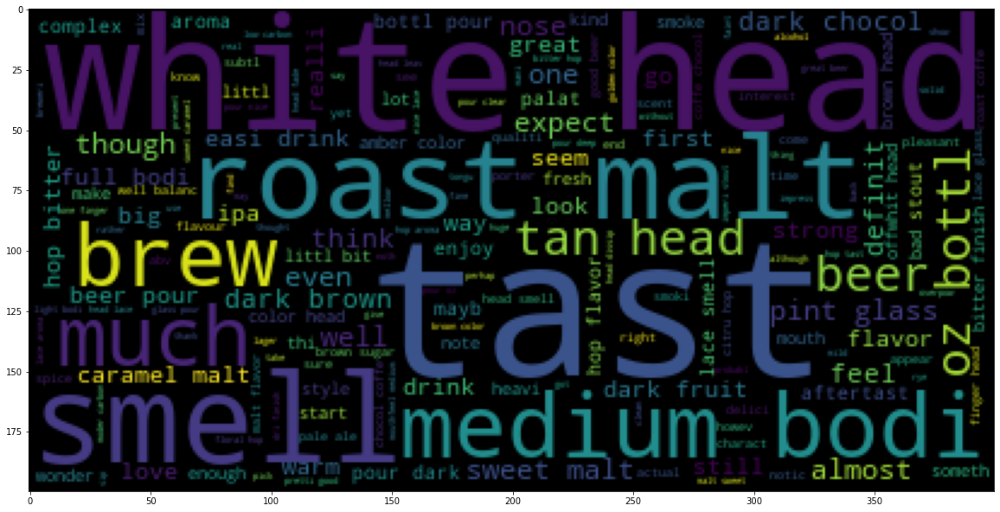

In [43]:
from wordcloud import WordCloud

plt.figure(figsize=(20,20))
plt.imshow(WordCloud().generate(sentence))

In [44]:
df.shape

(37490, 11)

In [45]:
from sklearn.feature_extraction.text import CountVectorizer

reviews_cleaned_vectorized=CountVectorizer(analyzer=review_cleaning,dtype='uint8',max_features=10000).fit_transform(df['review/text'])

In [46]:
reviews_cleaned_vectorized.shape

(37490, 10000)

In [47]:
df.drop(['review/text'],axis='columns',inplace=True)

In [48]:
df.head(5)

,index,beer/ABV,beer/beerId,beer/brewerId,review/appearance,review/aroma,review/overall,review/palate,review/taste,review/timeUnix
0,0,0.085069,0.603113,0.515794,0.8,0.750,9.0,0.750,0.750,0.757813
1,1,0.189236,0.036712,0.014175,0.8,0.625,8.0,0.625,0.500,0.729912
2,2,0.079861,0.010204,0.013095,0.7,0.750,8.0,0.625,0.625,0.438025
3,3,0.074653,0.003297,0.000000,0.6,0.500,6.0,0.500,0.500,0.955660
4,4,0.074653,0.061390,0.050943,0.8,0.500,7.0,0.625,0.375,0.934111


In [49]:
reviews_cleaned_vectorized= pd.DataFrame(reviews_cleaned_vectorized.toarray())

In [50]:
reviews_cleaned_vectorized.head(5)

,0,1,2,3,4,5,6,7,8,9,...,9990,9991,9992,9993,9994,9995,9996,9997,9998,9999
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [51]:
reviews_cleaned_vectorized.shape

(37490, 10000)

In [52]:
reviews_cleaned_vectorized.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37490 entries, 0 to 37489
Columns: 10000 entries, 0 to 9999
dtypes: uint8(10000)
memory usage: 357.5 MB


In [53]:
df1=pd.concat([reviews_cleaned_vectorized,df],axis=1)

In [54]:
df1.head(5)

,0,1,2,3,4,5,6,7,8,9,...,index,beer/ABV,beer/beerId,beer/brewerId,review/appearance,review/aroma,review/overall,review/palate,review/taste,review/timeUnix
0,0,0,0,0,0,0,0,0,0,0,...,0,0.085069,0.603113,0.515794,0.8,0.750,9.0,0.750,0.750,0.757813
1,0,0,0,0,0,0,0,0,0,0,...,1,0.189236,0.036712,0.014175,0.8,0.625,8.0,0.625,0.500,0.729912
2,0,0,0,0,0,0,0,0,0,0,...,2,0.079861,0.010204,0.013095,0.7,0.750,8.0,0.625,0.625,0.438025
3,0,0,0,0,0,0,0,0,0,0,...,3,0.074653,0.003297,0.000000,0.6,0.500,6.0,0.500,0.500,0.955660
4,1,0,0,0,0,0,0,0,0,0,...,4,0.074653,0.061390,0.050943,0.8,0.500,7.0,0.625,0.375,0.934111


In [55]:
df1.drop(['index'],axis='columns',inplace=True)

### PreProcessing Completed!! 

In [56]:
X=df1.drop(['review/overall','review/appearance','review/aroma','review/palate','review/taste'],axis='columns')
Y=df1['review/overall']

In [57]:
X.shape,Y.shape

((37490, 10004), (37490,))

In [58]:
Y=pd.get_dummies(Y,dtype='int8')

In [59]:
Y

,1.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0
0,0,0,0,0,0,0,0,1,0,0
1,0,0,0,0,0,0,1,0,0,0
2,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,1,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
37485,0,0,0,0,0,0,1,0,0,0
37486,0,0,0,0,0,0,1,0,0,0
37487,0,0,0,0,0,0,0,1,0,0
37488,0,0,0,0,0,0,0,1,0,0


## ML Model 

In [60]:
from tensorflow import keras
from tensorflow.keras.layers import Dense,Dropout

In [61]:
model=keras.Sequential([
    
    Dense(X.shape[1]/4,input_shape=(X.shape[1],),activation='relu'),
    Dropout(0.25),

    
    #Dense(X.shape[1]/16,input_shape=(X.shape[1],),activation='relu'),
    
    Dense(X.shape[1]/64,activation='relu'),
    Dropout(0.2),
    #Dense(X.shape[1]/512,input_shape=(X.shape[1],),activation='relu'),
    
    Dense(X.shape[1]/1024,activation='relu'),
    Dropout(0.2),
    Dense(10,activation='softmax')
    
])
model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy','MeanSquaredError','AUC'])
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 2501)              25022505  
_________________________________________________________________
dropout (Dropout)            (None, 2501)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 156)               390312    
_________________________________________________________________
dropout_1 (Dropout)          (None, 156)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 9)                 1413      
_________________________________________________________________
dropout_2 (Dropout)          (None, 9)                 0         
_________________________________________________________________
dense_3 (Dense)              (None, 10)                1

In [62]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from livelossplot.inputs.tf_keras import PlotLossesCallback

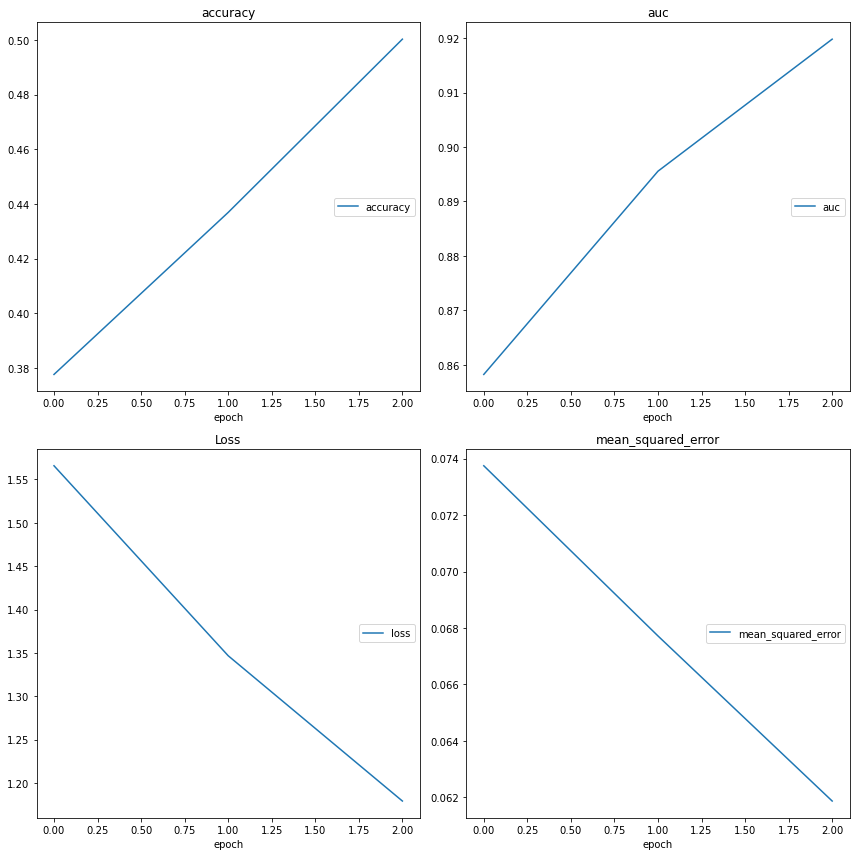

accuracy
	accuracy         	 (min:    0.378, max:    0.500, cur:    0.500)
auc
	auc              	 (min:    0.858, max:    0.920, cur:    0.920)
Loss
	loss             	 (min:    1.179, max:    1.566, cur:    1.179)
mean_squared_error
	mean_squared_error 	 (min:    0.062, max:    0.074, cur:    0.062)
1172/1172 [==============================] - 198s 169ms/step - loss: 1.1792 - accuracy: 0.5003 - mean_squared_error: 0.0619 - auc: 0.9198


In [63]:
#early_stopping=EarlyStopping(monitor='val_accuracy',patience=1,verbose=0,mode='max',restore_best_weights=False)
callbacks=[PlotLossesCallback()]

history=model.fit(X,Y,epochs=3,verbose=1,callbacks=callbacks)

In [64]:
Y_predicted=model.predict(X)

In [65]:
Y_pred=Y_predicted.copy()

In [66]:
Y_pred_1=[]
for item in Y_pred:
    k=np.argmax(item)
    for key,value in classes.items():
        if k==1:
            if value==k:
                Y_pred_1.append(key)
        
        else:
            if value==k+1:
                Y_pred_1.append(key)
            

Y_pred_1    

[3.5,
 3,
 3,
 2.0,
 2.5,
 3.5,
 3.5,
 3.5,
 4,
 2.5,
 3.5,
 3.5,
 4,
 2.5,
 3,
 3.5,
 2.5,
 3.5,
 3.5,
 3.5,
 3.5,
 3.5,
 4,
 3.5,
 3.5,
 3.5,
 4,
 4,
 3.5,
 3.5,
 3,
 4,
 3,
 3.5,
 3.5,
 4,
 3,
 3.5,
 3,
 3.5,
 4,
 3,
 4,
 3,
 4,
 2.0,
 2.5,
 3.5,
 3,
 4,
 3.5,
 3.5,
 3.5,
 2.5,
 3.5,
 3.5,
 3.5,
 3.5,
 3.5,
 3.5,
 3.5,
 3.5,
 3.5,
 3.5,
 3.5,
 3,
 4.5,
 3.5,
 3.5,
 3,
 3.5,
 4,
 3.5,
 3,
 3.5,
 3.5,
 3.5,
 2.5,
 3.5,
 3.5,
 4,
 4,
 3.5,
 4,
 4,
 3.5,
 4,
 3,
 3.5,
 3,
 3.5,
 4,
 3.5,
 3.5,
 3.5,
 3.5,
 3.5,
 3.5,
 3,
 3.5,
 3,
 2.5,
 3.5,
 3,
 3.5,
 3.5,
 4,
 1.5,
 3.5,
 3,
 4,
 3.5,
 3.5,
 3.5,
 3.5,
 2.5,
 4,
 3.5,
 2.5,
 2.5,
 3.5,
 3.5,
 3.5,
 4,
 3.5,
 1.5,
 3,
 3.5,
 1.5,
 3.5,
 4,
 4,
 3.5,
 3.5,
 4,
 3.5,
 3.5,
 4,
 2.5,
 3.5,
 3.5,
 3.5,
 3.5,
 2.5,
 3,
 3.5,
 3.5,
 3.5,
 4,
 3.5,
 3,
 2.5,
 3.5,
 4,
 4,
 3.5,
 3.5,
 3.5,
 3.5,
 3,
 3.5,
 2.5,
 3,
 3.5,
 3.5,
 4,
 4,
 2.5,
 2.5,
 2.5,
 4,
 3,
 3,
 3.5,
 4,
 2.5,
 3.5,
 3.5,
 3.5,
 3,
 4,
 3,
 3.5,
 2.5,
 3.5,
 4,
 4.5,
 2.5

In [67]:
Y=df['review/overall'].astype('int8')

In [68]:
Y.value_counts()

9     13867
10     8662
8      6550
7      3319
11     2667
6      1193
5       807
4       248
3       176
1         1
Name: review/overall, dtype: int64

In [69]:
Y_mod=[]
for item in Y:
    for key,value in classes.items():
        if value==item:
            Y_mod.append(key)

Y_mod

[4,
 3.5,
 3.5,
 2.5,
 3,
 4,
 4,
 4,
 4.5,
 2.0,
 4.5,
 4,
 5,
 2.0,
 4,
 4,
 3,
 4,
 4,
 4,
 4,
 4,
 5,
 4,
 4,
 4,
 4.5,
 4.5,
 4,
 4.5,
 3.5,
 4.5,
 3.5,
 4.5,
 4,
 4.5,
 3,
 4,
 3.5,
 3.5,
 4.5,
 3.5,
 4.5,
 3.5,
 4.5,
 1.5,
 2.5,
 4,
 3.5,
 5,
 4,
 4,
 4,
 3,
 4,
 4,
 4.5,
 4,
 4.5,
 3.5,
 3.5,
 4,
 4,
 4.5,
 4,
 3.5,
 4.5,
 3.5,
 4,
 4,
 4,
 5,
 4,
 3.5,
 4.5,
 3.5,
 4,
 3,
 4,
 4,
 4.5,
 4,
 4,
 4.5,
 4.5,
 4,
 5,
 3.5,
 4,
 3,
 4,
 4.5,
 4,
 4,
 3.5,
 4,
 4,
 4,
 3.5,
 3.5,
 4,
 3,
 4,
 3.5,
 4,
 4.5,
 4.5,
 1.5,
 4,
 3.5,
 4.5,
 4,
 4,
 3.5,
 4,
 3.5,
 5,
 4,
 1,
 5,
 4,
 4,
 4.5,
 4.5,
 3.5,
 1.5,
 3.5,
 4,
 2.0,
 4,
 5,
 4,
 4,
 4,
 4.5,
 4,
 3.5,
 4.5,
 3.5,
 3.5,
 4,
 4,
 4,
 2.0,
 3.5,
 4,
 3.5,
 4,
 4.5,
 4.5,
 3.5,
 2.0,
 4,
 4.5,
 4.5,
 3.5,
 4,
 4,
 4,
 3.5,
 4,
 3.5,
 3.5,
 4,
 2.5,
 4,
 4.5,
 2.5,
 2.5,
 3,
 4.5,
 3.5,
 3.5,
 3.5,
 4.5,
 3,
 3.5,
 4,
 4.5,
 4,
 4.5,
 3.5,
 3.5,
 3,
 4,
 4.5,
 5,
 3,
 3.5,
 3.5,
 4,
 3.5,
 3.5,
 4,
 5,
 4.5,
 4,
 4.5,
 3,
 4,
 2.0,


In [70]:
from collections import Counter

print(Counter(Y_mod))
print(Counter(Y_pred_1))


Counter({4: 13867, 4.5: 8662, 3.5: 6550, 3: 3319, 5: 2667, 2.5: 1193, 2.0: 807, 1.5: 248, 1: 176, 0: 1})
Counter({3.5: 17405, 4: 9250, 3: 4829, 2.5: 4549, 4.5: 797, 1.5: 611, 2.0: 49})
